In [1]:
import pandas as pd
import json
import cv2
import os

In [ ]:
!git clone https://github.com/ultralytics/yolov5
!pip install -r /content/yolov5/requirements.txt

In [4]:
def parse_shape(shape):
    data, start, end = [], [], []
    
    for index, s in enumerate(shape):
        if s=='{':
            start.append(index)
        if s=='}':
            end.append(index+1)
    
    for s, e in zip(start, end):
        data.append(json.loads(shape[s:e]))
    return data


def write_txt(data, save_path):
    with open(save_path, 'w') as f:
        for line in data:
            f.write(f"{line}\n")

def shape2yolo(shape, img_path, save_path):
    data = parse_shape(shape)
    h, w, _ = cv2.imread(img_path).shape
    peoples = []
    
    for i in data:
        x_c, y_c, w_2 = i['cx'], i['cy'], i['r']
        w_2 = w_2*2/w
        x_c /= w
        y_c /= h
        peoples.append(f"0 {x_c} {y_c} {w_2} {w_2}")
    
    write_txt(peoples, save_path)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
train_dataset_df = pd.read_csv('/content/drive/MyDrive/OTUS-CV-final-project/anno_train.csv', delimiter=' ')

In [7]:
# Скачаем и распакуем данные
! unzip /content/drive/MyDrive/OTUS-CV-final-project/peoples.zip > /dev/null

In [8]:
src_img_dir = "/content/train/"
!mkdir -p /content/train/labels
!mkdir -p /content/train/images
!mv /content/images_train/* /content/train/images/
base_img_dir = "/content/train/images/"

In [9]:
for index, row in train_dataset_df.iterrows():
  shape = row['boxes']
  shape2yolo(shape, os.path.join(base_img_dir, row['name']), os.path.join(src_img_dir, 'labels', row['name'].split('.')[0]+'.txt'))

In [10]:
test_dataset_df = pd.read_csv('/content/drive/MyDrive/OTUS-CV-final-project/anno_test.csv', delimiter=' ')

In [11]:
src_img_dir = "/content/test/"
!mkdir -p /content/test/labels
!mkdir -p /content/test/images
!mv /content/images_test/* /content/test/images/
base_img_dir = "/content/test/images/"

In [12]:
for index, row in test_dataset_df.iterrows():
  shape = row['boxes']
  shape2yolo(shape, os.path.join(base_img_dir, row['name']), os.path.join(src_img_dir, 'labels', row['name'].split('.')[0]+'.txt'))

In [ ]:
!python /content/yolov5/train.py --img 1280 --batch -1 --epochs 100 --data "/content/drive/MyDrive/OTUS-CV-final-project/peoples.yaml" --weights yolov5m6.pt

train: weights=yolov5m6.pt, cfg=, data=/content/drive/MyDrive/OTUS-CV-final-project/peoples.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=-1, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, a

In [13]:
!python /content/yolov5/detect.py --source "/content/test/images/" --weights "/content/drive/MyDrive/OTUS-CV-final-project/yolo-best.pt" --save-txt --save-conf --name "yolov5m6_people_test" --imgsz 1280 --exist-ok --conf-thres 0.2

detect: weights=['/content/drive/MyDrive/OTUS-CV-final-project/yolo-best.pt'], source=/content/test/images/, data=yolov5/data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=yolov5m6_people_test, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CPU

Fusing layers... 
Model summary: 276 layers, 35248920 parameters, 0 gradients, 48.9 GFLOPs
image 1/3 /content/test/images/8406.jpg: 768x1280 4 mans, 2293.4ms
image 2/3 /content/test/images/8464.JPG: 768x1280 4 mans, 2230.5ms
image 3/3 /content/test/images/8507.JPG: 768x1280 2 mans, 2161.3ms
Speed: 2.6ms pre-process, 2228.4ms inference, 9.0ms NMS per image at shape (1, 3, 1280, 1280)
Results saved to 

In [14]:
from PIL import Image, ImageDraw
import random
import numpy as np
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt

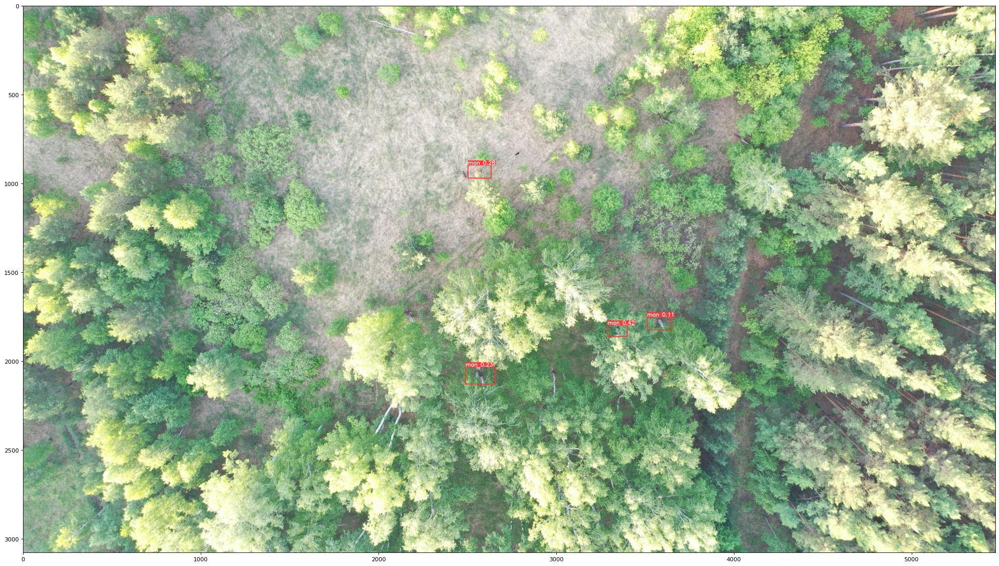

In [15]:
detections_dir = "/content/yolov5/runs/detect/yolov5m6_people_test/"
detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]

random_detection_image = Image.open(random.choice(detection_images))
figure(num=None,figsize=(30,30),dpi=80)
plt.imshow(np.array(random_detection_image))

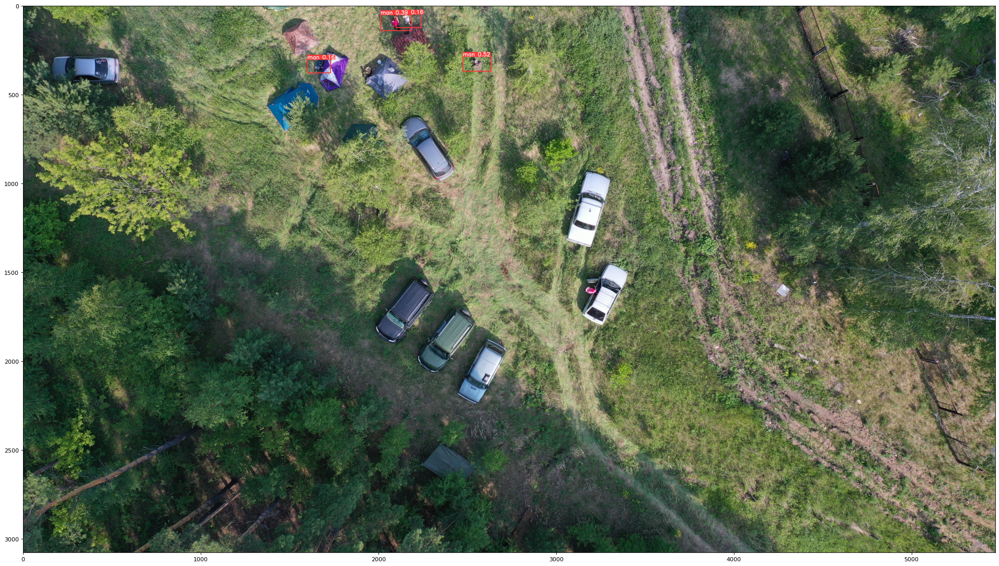

In [16]:
detections_dir = "/content/yolov5/runs/detect/yolov5m6_people_test/"
detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]

random_detection_image = Image.open(random.choice(detection_images))
figure(num=None,figsize=(30,30),dpi=80)
plt.imshow(np.array(random_detection_image))

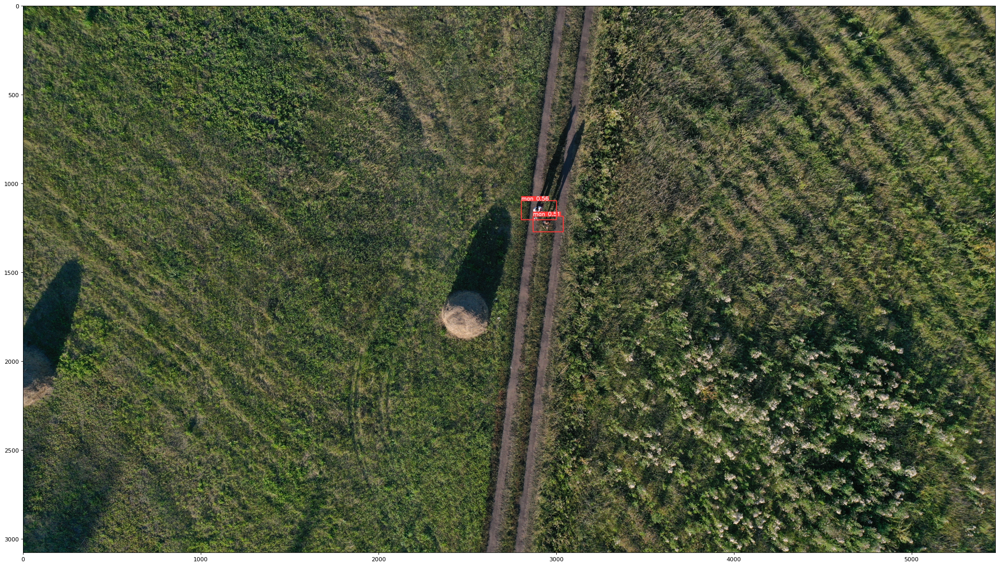

In [18]:
detections_dir = "/content/yolov5/runs/detect/yolov5m6_people_test/"
detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]

random_detection_image = Image.open(random.choice(detection_images))
figure(num=None,figsize=(30,30),dpi=80)
plt.imshow(np.array(random_detection_image))